# ModConversion - Predecir conversión de usuarios - Tipo Trader

## Notebook para probar diferentes configuraciones y obtener el modelo.
Este notebook lee los datos históricos de los usuarios de tipo Trader, así como una serie de parámetros asociados al proceso de registro, recogida de datos por regulación y diferentes acciones realizadas por los usuarios antes de convertires en clientes. Con estos datos queremos poder predecir si el usuario se convertirá en cliente, y que probabilidad hay de que se produzca.

# 0. Configuración

Instalar pycaret si fuese necesario

In [1]:
pip install pycaret

/opt/conda/lib/python3.7/site-packages/secretstorage/dhcrypto.py:16: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/opt/conda/lib/python3.7/site-packages/secretstorage/util.py:25: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
  Using cached pycaret-2.3.1-py3-none-any.whl (261 kB)
  Using cached spacy-2.3.5-cp37-cp37m-manylinux2014_x86_64.whl (10.4 MB)
  Using cached yellowbrick-1.3.post1-py3-none-any.whl (271 kB)
  Using cached lightgbm-3.2.1-py3-none-manylinux1_x86_64.whl (2.0 MB)
  Using cached mlflow-1.17.0-py3-none-any.whl (14.2 MB)
  Using cached scikit_plot-0.3.7-py3-none-any.whl (33 kB)
  Using cached pandas_profiling-3.0.0-py2.py3-none-any.whl (248 kB)
  Using cached pyLDAvis-3.3.1-py2.py3-none-any.whl
  Using cached Boruta-0.3-py3-none-any.whl (56 kB)
  Using cached plotly-4.14.3-py2.py3-none-any.w

In [84]:
import pandas as pd
from pycaret.classification import *
import datetime
import os
S3=client('s3')

# 1. Carga de datos

In [85]:
dataset_raw = pd.read_csv('s3://tfm-2021-darwinex/data/model3/trader/dataset_ModConversion_traders.csv')
dataset_raw.head()

,user_currency,user_country,start_mifid_days,has_finished_mifid,finish_mifid_days,has_deposit,first_deposit_days,first_deposit_amount,first_deposit_platform,mifid_actual_savings,...,linked_account_days,has_demo_account,demo_account_days,has_demo_trade,demo_trade_days,has_mock_account,mock_account_days,user_flow_name,days_until_conversion_or_today,is_converted
0,USD,159,0.0,1,1.0,1,1.0,900.0,4,6,...,NaN,0,NaN,0,NaN,0,NaN,2,1,1
1,USD,30,0.0,1,0.0,1,0.0,6000.0,3,7,...,NaN,1,0.0,0,NaN,0,NaN,2,0,1
2,USD,42,0.0,1,0.0,1,1.0,2000.0,3,13,...,NaN,0,NaN,0,NaN,0,NaN,2,1,1
3,USD,30,1.0,1,1.0,0,NaN,0.0,1,12,...,NaN,0,NaN,0,NaN,0,NaN,2,8,0
4,GBP,52,0.0,0,NaN,0,NaN,0.0,1,7,...,NaN,0,NaN,0,NaN,0,NaN,2,8,0


# 2. Iniciar PyCaret

A la hora de inicializar PyCaret solo hemos activado la normalización de los datos, y configurado la columna que es el objetivo (label_num) y las columnas a ignorar.

In [86]:
clf1 = setup(dataset_raw, normalize=True, target = 'is_converted', categorical_features=['user_country'],  fix_imbalance=True, silent=True)

,Description,Value
0,session_id,6699
1,Target,is_converted
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(17836, 26)"
5,Missing Values,True
6,Numeric Features,9
7,Categorical Features,16
8,Ordinal Features,False
9,High Cardinality Features,False


# 3. Crear el modelo y elegir la mejor opción

In [87]:
top = compare_models(n_select=1, sort='Recall')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.9606,0.0000,1.0000,0.8598,0.9246,0.8981,0.9028,1.0490
lda,Linear Discriminant Analysis,0.9605,0.9940,0.9997,0.8597,0.9244,0.8979,0.9026,1.3860
qda,Quadratic Discriminant Analysis,0.9573,0.9710,0.9973,0.8514,0.9186,0.8899,0.8950,1.1880
svm,SVM - Linear Kernel,0.9904,0.0000,0.9947,0.9666,0.9804,0.9740,0.9742,1.0920
lr,Logistic Regression,0.9896,0.9991,0.9940,0.9640,0.9788,0.9719,0.9721,1.5570
nb,Naive Bayes,0.9594,0.9728,0.9937,0.8600,0.9220,0.8947,0.8990,1.0200
rf,Random Forest Classifier,0.9908,0.9993,0.9927,0.9699,0.9812,0.9751,0.9752,1.6790
knn,K Neighbors Classifier,0.9757,0.9919,0.9914,0.9153,0.9518,0.9356,0.9370,5.9910
et,Extra Trees Classifier,0.9871,0.9990,0.9914,0.9569,0.9738,0.9652,0.9655,1.7580
gbc,Gradient Boosting Classifier,0.9920,0.9995,0.9907,0.9765,0.9835,0.9782,0.9783,3.8070


# 4. Ajustar hiperparámetros

In [88]:
top_tuned = tune_model(top, optimize='Recall')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9624,0.0000,1.0000,0.8653,0.9278,0.9025,0.9069
1,0.9648,0.0000,1.0000,0.8728,0.9321,0.9085,0.9123
2,0.9624,0.0000,1.0000,0.8653,0.9278,0.9025,0.9069
3,0.9616,0.0000,1.0000,0.8629,0.9264,0.9006,0.9051
4,0.9608,0.0000,1.0000,0.8600,0.9247,0.8984,0.9031
5,0.9575,0.0000,1.0000,0.8503,0.9191,0.8906,0.8959
6,0.9615,0.0000,1.0000,0.8625,0.9262,0.9003,0.9048
7,0.9631,0.0000,1.0000,0.8674,0.9290,0.9043,0.9085
8,0.9551,0.0000,1.0000,0.8431,0.9149,0.8847,0.8907
9,0.9567,0.0000,1.0000,0.8479,0.9177,0.8886,0.8942


## 4.1 Calibramos el modelo para mostrar la probabilidad

In [89]:
calibrated_dt = calibrate_model(top_tuned)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9776,0.9985,0.9934,0.9202,0.9554,0.9405,0.9417
1,0.9808,0.9993,0.9934,0.9317,0.9615,0.9487,0.9496
2,0.9816,0.9992,0.9967,0.9319,0.9632,0.9509,0.9519
3,0.9808,0.9985,1.0000,0.9264,0.9618,0.9490,0.9502
4,0.9872,0.9990,0.9967,0.9524,0.9740,0.9655,0.9660
5,0.9800,0.9994,0.9967,0.9259,0.9600,0.9467,0.9478
6,0.9808,0.9988,0.9967,0.9288,0.9615,0.9487,0.9498
7,0.9832,0.9992,0.9967,0.9375,0.9662,0.9550,0.9558
8,0.9776,0.9987,1.0000,0.9149,0.9556,0.9406,0.9423
9,0.9752,0.9986,0.9934,0.9116,0.9507,0.9342,0.9357


# 5. Probar modelo con datos de test

In [90]:
predict_new = predict_model(calibrated_dt)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ridge Classifier,0.9793,0.9992,1.0000,0.9207,0.9587,0.9449,0.9463


In [91]:
predict_new

,start_mifid_days,finish_mifid_days,first_deposit_days,first_deposit_amount,linked_account_days,demo_account_days,demo_trade_days,mock_account_days,days_until_conversion_or_today,user_currency_EUR,...,has_linked_account_0,has_demo_account_0,has_demo_trade_0,has_mock_account_1,user_flow_name_0,user_flow_name_1,user_flow_name_2,is_converted,Label,Score
0,-0.208611,-9.531593e-09,-3.047453e-09,-0.154982,4.986030e-10,-1.602295e-09,1.127786e-09,8.459479e-10,0.226401,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0,0,1.0000
1,-0.288847,-4.121577e-01,-3.047453e-09,-0.154982,4.986030e-10,-1.602295e-09,1.127786e-09,8.459479e-10,0.133563,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0,0,1.0000
2,-0.197148,-3.768952e-01,-3.047453e-09,-0.154982,4.986030e-10,-1.602295e-09,1.127786e-09,8.459479e-10,0.999055,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0,0,1.0000
3,-0.288847,-4.944372e-01,-3.047453e-09,-0.154982,4.986030e-10,-1.602295e-09,1.127786e-09,8.459479e-10,0.978092,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0,0,1.0000
4,-0.288847,-4.826829e-01,-3.047453e-09,-0.154982,4.986030e-10,-1.602295e-09,1.127786e-09,8.459479e-10,0.184474,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0,0,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5346,1.052251,8.690499e-01,6.763578e-01,-0.017033,4.986030e-10,-5.192524e-01,-5.447184e-01,8.459479e-10,-0.818778,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1,1,0.9981
5347,-0.288847,-5.061913e-01,-3.047453e-09,-0.154982,4.986030e-10,-1.602295e-09,1.127786e-09,8.459479e-10,-0.669039,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0,0,1.0000
5348,-0.288847,-5.061913e-01,-9.545111e-01,0.841627,4.986030e-10,-1.602295e-09,1.127786e-09,8.459479e-10,-1.169167,1.0,...,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0,1,0.9577
5349,-0.242998,-4.239120e-01,-3.047453e-09,-0.154982,4.986030e-10,-1.602295e-09,1.127786e-09,8.459479e-10,0.199448,0.0,...,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0,0,1.0000


 # 6. Mostrar información del modelo

## 6.1 Precision Recall Curve

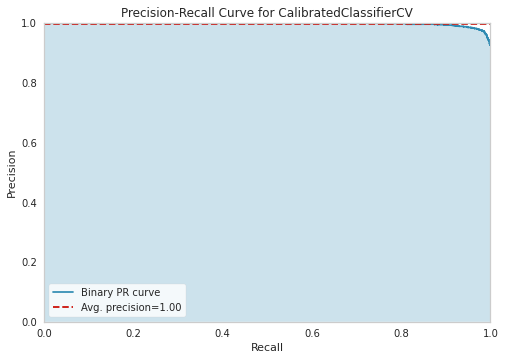

In [92]:
plot_model(calibrated_dt, plot='pr')

## 6.2 Confusion Matrix

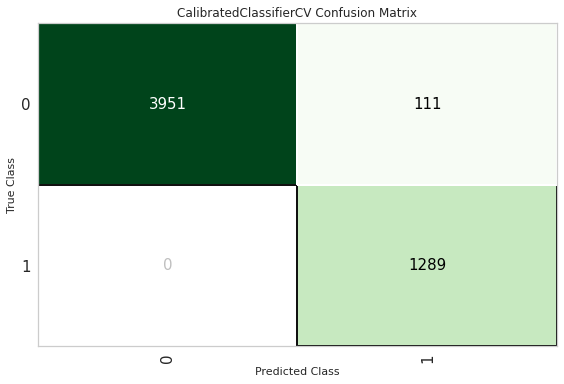

In [93]:
plot_model(calibrated_dt, plot='confusion_matrix')

## 6.3 Class Prediction Error

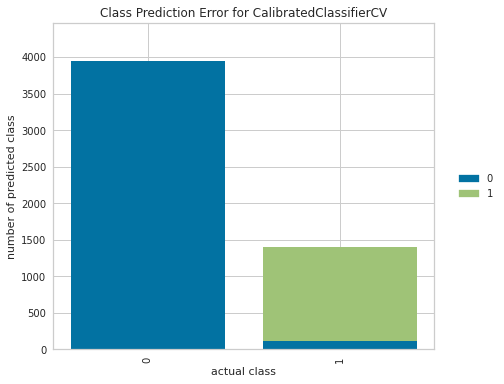

In [94]:
plot_model(calibrated_dt, plot='error')

## 6.4 Classification Report

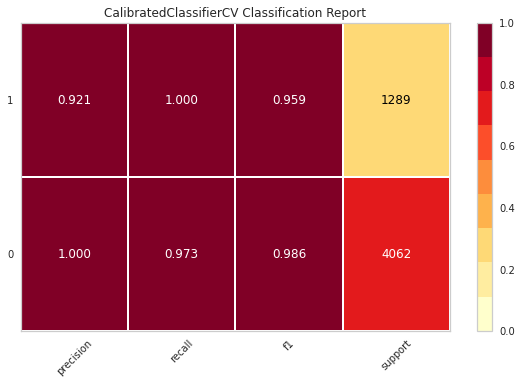

In [95]:
plot_model(calibrated_dt, plot='class_report')

## 6.5 Learning Curve

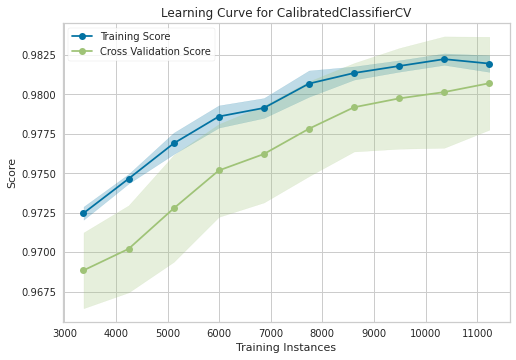

In [96]:
plot_model(calibrated_dt, plot='learning')

## 6.6 Feature Importance

El modelo calibrado no permite representar esta grafica, por lo que utilizamos el modelo justo antes de calibrarlo.

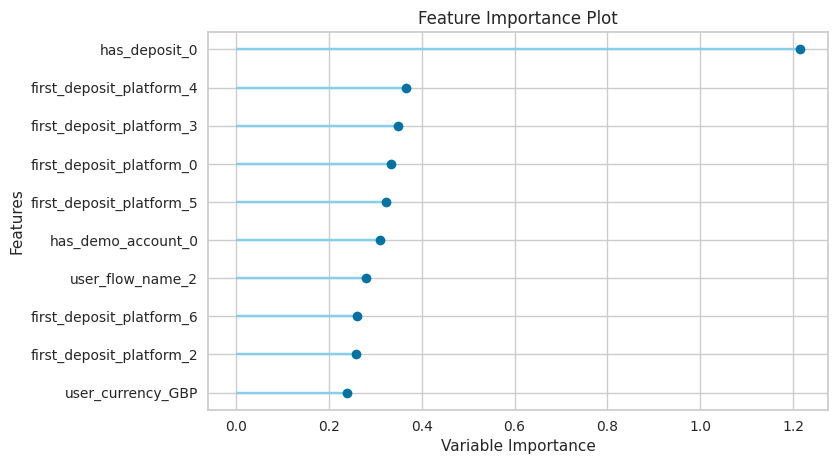

In [97]:
plot_model(top_tuned, plot='feature')

## 6.7 Area Under the Curve

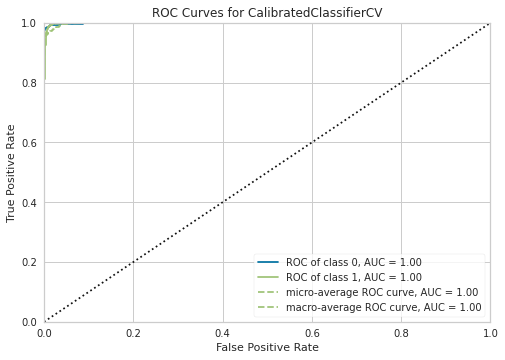

In [98]:
try:
    plot_model(calibrated_dt, plot='auc')
except Exception as ex:
    print("This model can't measure auc.")

 # 7. Finalizar y guardar modelo

In [99]:
final_model = finalize_model(calibrated_dt)

In [100]:
#save_model(final_model, model_name='ModConversion', verbose=False)
#S3.upload_file('ModConversion.pkl', 'tfm-2021-darwinex', 'models/ModConversion/trader/final_model.pkl')
#S3.upload_file('ModConversion.pkl', 'tfm-2021-darwinex', 'models/ModConversion/trader/history/{}_model'.format(datetime.datetime.now()))